# **Transfer learning based damage road detection for multiple countries**

## Task :

1. Object Detection and classification.
2. Fine tune pretrained models to our dataset.

Link for referenence for training models:

https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html

In [ ]:
import os
from xml.etree import ElementTree
from bs4 import BeautifulSoup
import seaborn as sns
import collections
import pandas as pd
import xml.etree.ElementTree as ET
import cv2 
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
import shutil

In [ ]:
#untar train data
!tar -xvf '/content/train.tar'

after unzipping:

we get following folders




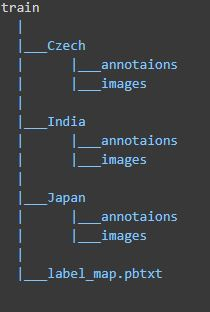



       


We can see We have data for three countries namely **Czech**,**India** and **Japan**.

In each country folder we have annotation folder and images folder.

**annotation folder** contains xml filesin PASCAL VOC format. We will see what exactly data xml file have.

**image folder** contains images in jpg format.

label_map.pbtxt file have labels with thier id's. We will see that as well

## First look at Xml file

In [ ]:
#We will check content in .xml file given for image 


with open('/content/train/Czech/annotations/xmls/Czech_000010.xml', 'r') as f: 
    data = f.read()

Bs_data = BeautifulSoup(data, "xml") 
Bs_data

<?xml version="1.0" encoding="utf-8"?>
<annotation>
<folder>images</folder>
<filename>Czech_000010.jpg</filename>
<size>
<depth>3</depth>
<width>600</width>
<height>600</height>
</size>
<object>
<name>D40</name>
<bndbox>
<xmin>213</xmin>
<ymin>409</ymin>
<xmax>274</xmax>
<ymax>441</ymax>
</bndbox>
</object>
<object>
<name>D10</name>
<bndbox>
<xmin>228</xmin>
<ymin>473</ymin>
<xmax>327</xmax>
<ymax>495</ymax>
</bndbox>
</object>
</annotation>

From xml file we can see following thing
1. Image name
2. image size
3. object with x,y axis dimension 
4. In single image we can have multiple objects that we have to class.

## Now we will see total images including all countries and labels

In [ ]:
# the number of total images and total labels.
country = ['Czech','India','Japan']
base_path = os.getcwd() + '/train/'
cls_names = []
total_images = 0
for cont in country:
    
    file_list = [filename for filename in os.listdir(base_path + cont + '/annotations/xmls/')]

    for file in file_list:

        total_images = total_images + 1
      
        infile_xml = open(base_path + cont + '/annotations/xmls/' +file)
        tree = ElementTree.parse(infile_xml)
        root = tree.getroot()
        for obj in root.iter('object'):
            cls_name = obj.find('name').text
            cls_names.append(cls_name)

print("Total number of images：" + str(total_images))
print("Total number of labels：" + str(len(cls_names)))

Total number of images：21041
Total number of labels：34702


In [ ]:
#check classes
damageTypes=list(set(cls_names))
print(damageTypes)
print('number of classes: ', len(damageTypes))

['D50', 'D00', 'D44', 'D0w0', 'D40', 'D43', 'D11', 'D10', 'D20', 'D01']
number of classes:  10


So, We have total 10 classes.

Now we will see distribution of these classes

D50 : 3553
D00 : 6025
D44 : 3995
D0w0 : 0
D40 : 2637
D43 : 736
D11 : 0
D10 : 4777
D20 : 6521
D01 : 0


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Distribution of classes')

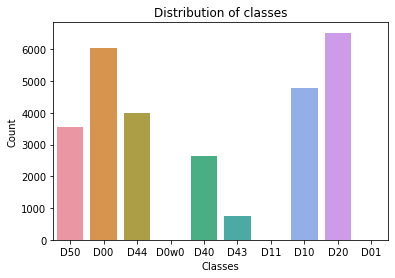

In [ ]:
# We will see Classes distribution for whole data
count_dict = collections.Counter(cls_names)
cls_count = []
for damageType in damageTypes:
    print(str(damageType) + ' : ' + str(count_dict[damageType]))
    cls_count.append(count_dict[damageType])
    
sns.set_palette("winter", 8)
sns.barplot(damageTypes, cls_count)
plt.xlabel('Classes')
plt.ylabel('Count')
plt.title('Distribution of classes')

We can see from above distribution that classes are not balance.

D0w0, D11, D01 and D43 are very rare classes.

Now we will see countriwise images count and label count

In [ ]:

# the number of each class labels for each country
for gov in country:
    cls_names = []
    total_images = 0
    file_list = [filename for filename in os.listdir(base_path + gov + '/annotations/xmls/')]

    for file in file_list:

        total_images = total_images + 1
      
        infile_xml = open(base_path + gov + '/annotations/xmls/' +file)
        tree = ElementTree.parse(infile_xml)
        root = tree.getroot()
        for obj in root.iter('object'):
          cls_name = obj.find('name').text
          cls_names.append(cls_name)
    print('Country : ',gov)
    print("\nTotal images in {} ： {}".format(gov , total_images))
    print("Total labels in {} ： {}\n".format(gov , len(cls_names)))
    
    count_dict = collections.Counter(cls_names)
    cls_count = []
    for damageType in damageTypes:
        print(str(damageType) + ' : ' + str(count_dict[damageType]))
        cls_count.append(count_dict[damageType])
    print('***************************************************************************************\n')


Country :  Czech

Total images in Czech ： 2829
Total labels in Czech ： 1745

D50 : 0
D00 : 988
D44 : 0
D0w0 : 0
D40 : 197
D43 : 0
D11 : 0
D10 : 399
D20 : 161
D01 : 0
***************************************************************************************

Country :  India

Total images in India ： 7706
Total labels in India ： 8203

D50 : 28
D00 : 1555
D44 : 1062
D0w0 : 1
D40 : 3187
D43 : 57
D11 : 45
D10 : 68
D20 : 2021
D01 : 179
***************************************************************************************

Country :  Japan

Total images in Japan ： 10506
Total labels in Japan ： 24754

D50 : 3553
D00 : 4049
D44 : 3995
D0w0 : 0
D40 : 2243
D43 : 736
D11 : 0
D10 : 3979
D20 : 6199
D01 : 0
***************************************************************************************



1. Czech country have only four classes (label)
2. India have all classes (10 classes)
3. Japan have 7 classes.

So we can say that only india contains all classes. Also in india we have class 'D0w0' occurs only once. We can remove that or wil not include while training.

Japan have more numbere of images compare to Czech and India.

So we have more versetile data.

### We will create two folder that will contain all the images and annotations file.

In [ ]:
! mkdir '/content/data/Images'

base_path = '/content/train/'
for cont in country:
  for fil in os.listdir(base_path + cont + '/images/'):
    shutil.copy(base_path + cont + '/images/'+ fil, "/content/data/Images") 
file_list = [filename for filename in os.listdir('/content/data/Images')]
print('Total images in Image folder  : ',len(file_list))

Total images in Image folder  :  21041


In [ ]:
! mkdir '/content/data/Annotations'

base_path = '/content/train/'
for cont in country:
  for fil in os.listdir(base_path + cont + '/annotations/xmls'):
    shutil.copy(base_path + cont + '/annotations/xmls/'+ fil, "/content/data/Annotations") 

file_list = [filename for filename in os.listdir('/content/data/Annotations')]
print('Total images in Annotation folder  : ',len(file_list))

Total images in Annotation folder  :  21041


## Convert xml to csv 

In [ ]:

def xml_to_csv(base_path):
    xml_list = []
    file_list = [filename for filename in os.listdir(base_path)]
    for file in file_list:
          infile_xml = open('/content/data/Annotations/' + file.split('.')[0] + '.xml')
          #print(base_path + gov + '/annotations/xmls/' + file)
          tree = ElementTree.parse(infile_xml)
          root = tree.getroot()
          for obj in root.findall('object'):
              value = (str(root.find('filename').text),
                       int(root.find('size').find('width').text),
                       int(root.find('size').find('height').text),
                       obj.find('name').text,
                       int(obj.find('bndbox').find('xmin').text),
                       int(obj.find('bndbox').find('ymin').text),
                       int(obj.find('bndbox').find('xmax').text),
                       int(obj.find('bndbox').find('ymax').text))
              xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'label', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


base_path =  '/content/data/Images'
labels_df = xml_to_csv(base_path)
labels_df.head(10)

,filename,width,height,label,xmin,ymin,xmax,ymax
0,Japan_003533.jpg,600,600,D10,167,546,448,577
1,Japan_003533.jpg,600,600,D10,219,503,392,530
2,Japan_001962.jpg,600,600,D44,308,337,335,373
3,Japan_001962.jpg,600,600,D44,362,438,468,592
4,Japan_001962.jpg,600,600,D20,72,380,569,595
5,Japan_001962.jpg,600,600,D00,282,340,298,397
6,India_002250.jpg,720,720,D40,412,559,503,617
7,India_002250.jpg,720,720,D40,397,627,450,656
8,India_002250.jpg,720,720,D40,543,592,647,718
9,Japan_012194.jpg,600,600,D44,325,485,508,598


In [ ]:
labels_df.shape

(34702, 8)

In [ ]:
image_with_label = list(set(labels_df.filename.values))

print('Number of images have labels : ', len(image_with_label))

Number of images have labels :  14569


In [ ]:
img_list = [filename for filename in os.listdir('/content/data/Images')]
annot_list = [filename for filename in os.listdir('/content/data/Annotations')]

### Plotting images with labels and bounding box

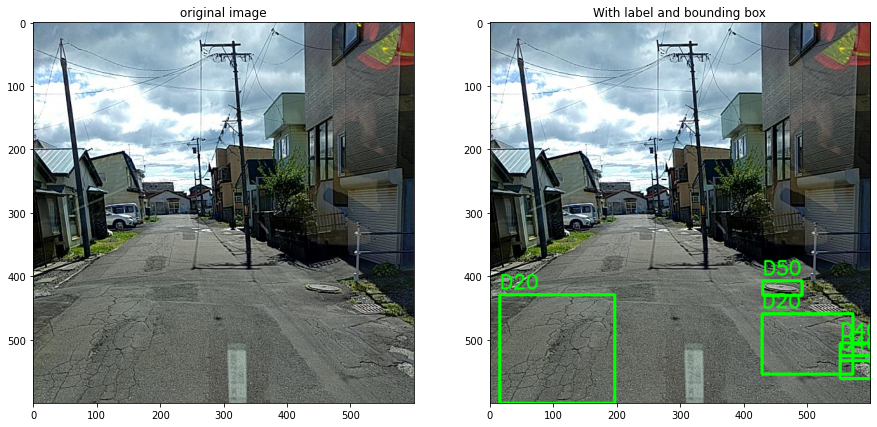

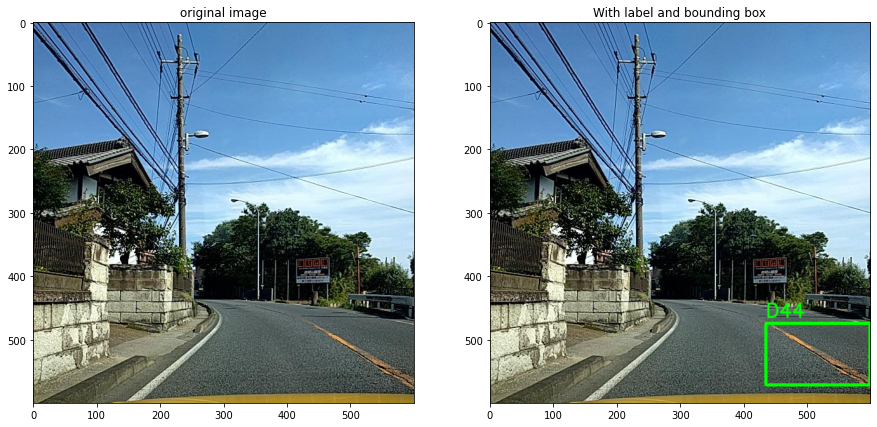

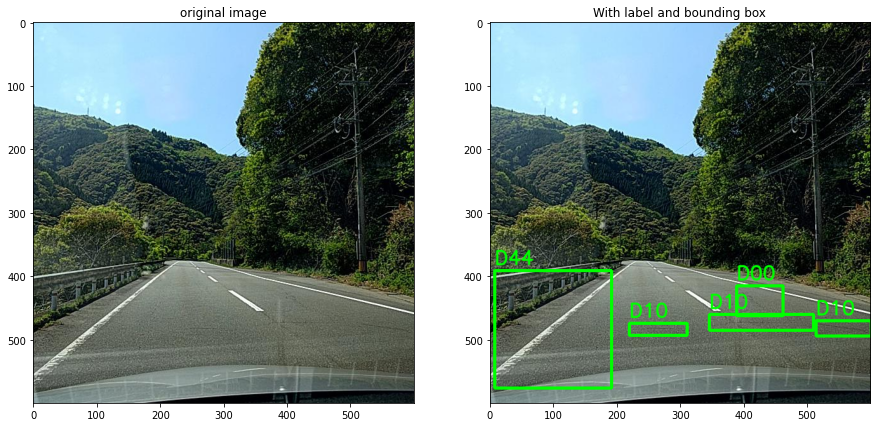

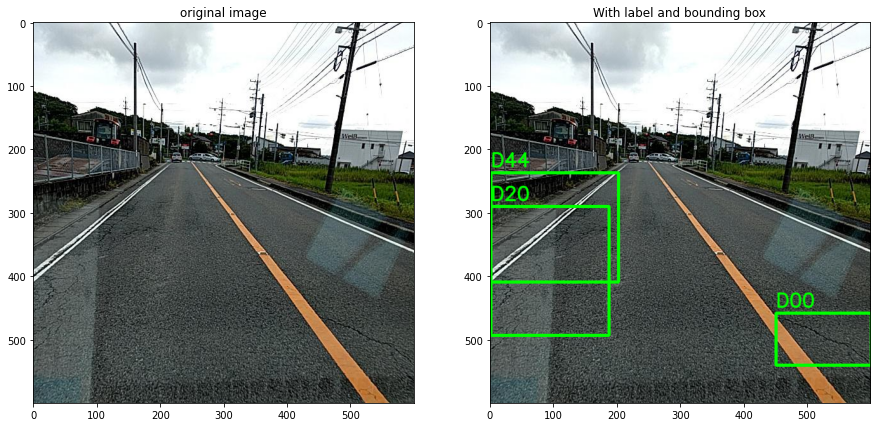

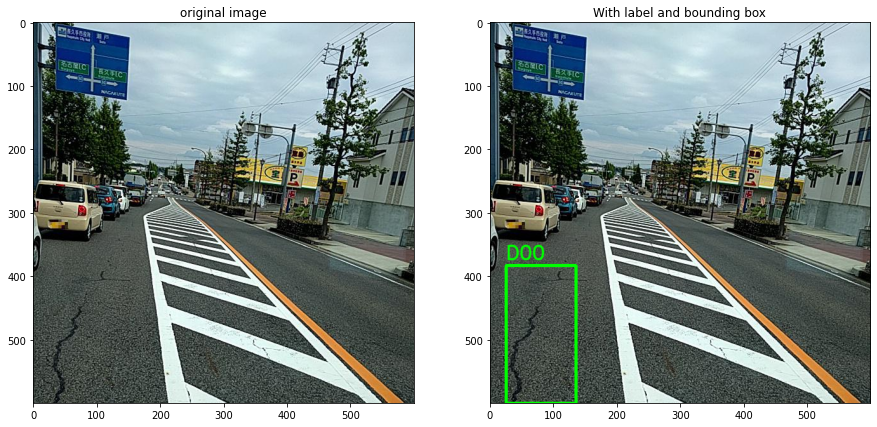

...

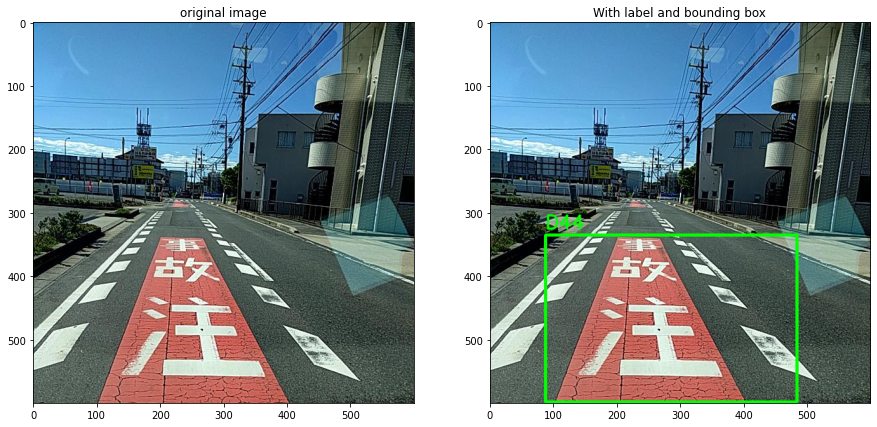

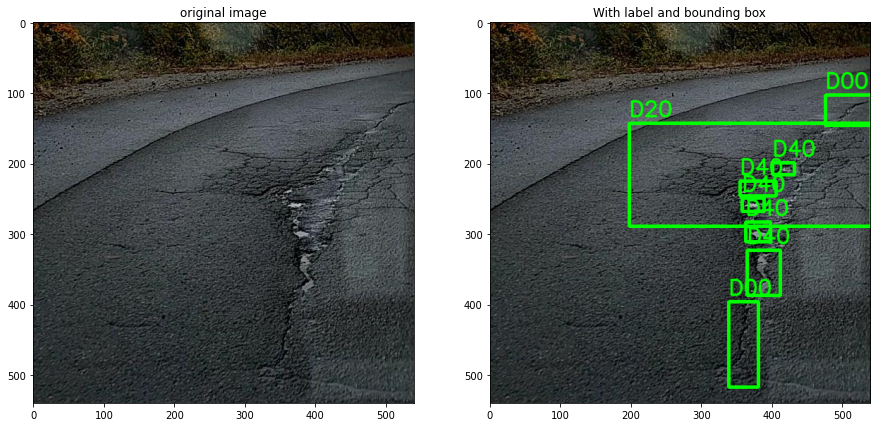

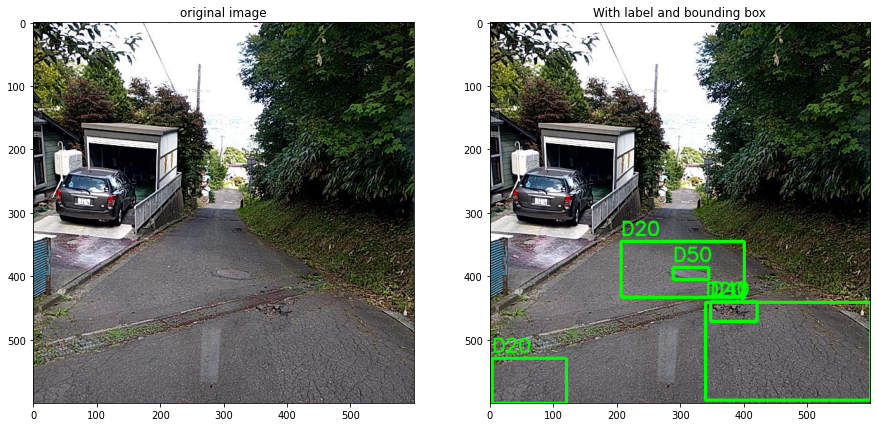

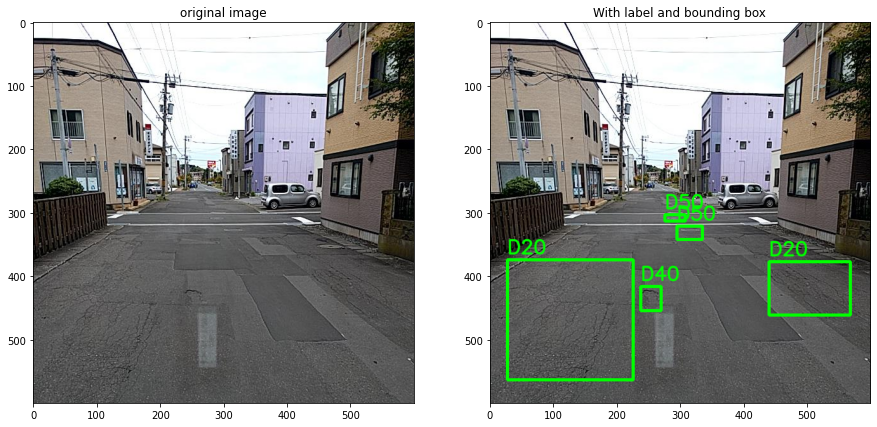

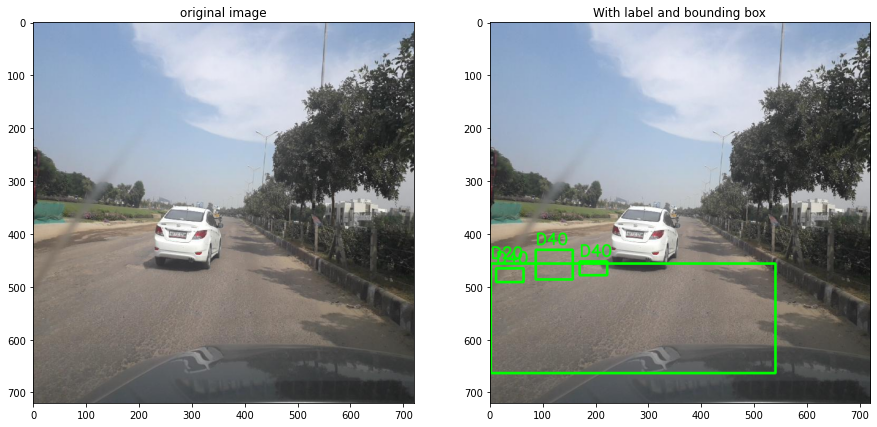

In [ ]:
def plot_image (img_file):
  gov = img_file.split('.')[0]
  image = cv2.imread('/content/data/Images/' + gov + '.jpg')
  image1 = cv2.imread('/content/data/Images/' + gov + '.jpg')

  infile_xml = open('/content/data/Annotations/' + gov + '.xml')
  tree = ElementTree.parse(infile_xml)
  root = tree.getroot()
    
  for obj in root.iter('object'):
        cls_name = obj.find('name').text
        xmlbox = obj.find('bndbox')
        xmin = int(xmlbox.find('xmin').text)
        xmax = int(xmlbox.find('xmax').text)
        ymin = int(xmlbox.find('ymin').text)
        ymax = int(xmlbox.find('ymax').text)

        font = cv2.FONT_HERSHEY_SIMPLEX

        # put text
        image1 = cv2.putText(image1,cls_name,(xmin,ymin-10),font,1,(0,255,0),2,cv2.LINE_AA)

        # draw bounding box
        image1 = cv2.rectangle(image1, (xmin, ymin), (xmax, ymax), (0,255,0),3)
  plt.figure(figsize=(15,15))
  plt.axis('off')
  plt.subplot(121)
  plt.title('original image')
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.subplot(122)
  plt.title('With label and bounding box')
  plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
  plt.show()
  
image_with_label = list(set(labels_df.filename.values))
for i in range(0,15):
  plot_image(image_with_label [i])

### Potting some images and images with bounding box with class  from csv file

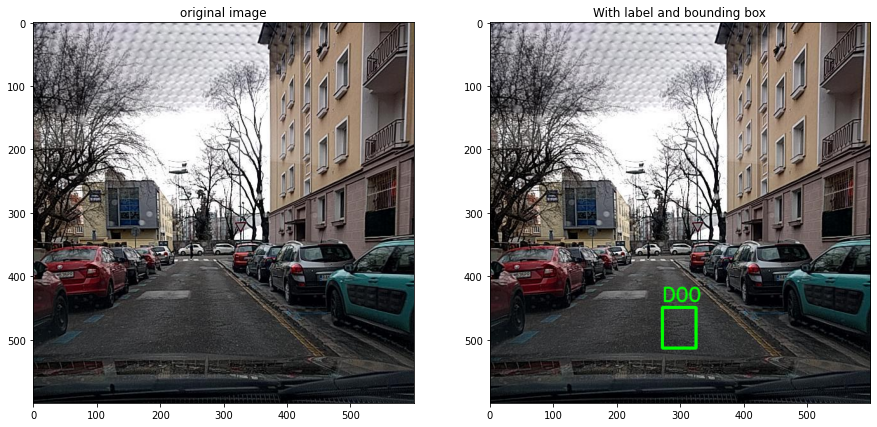

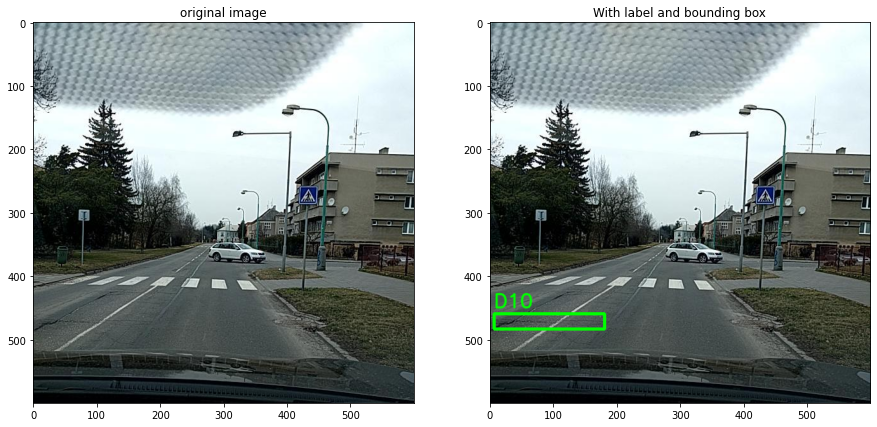

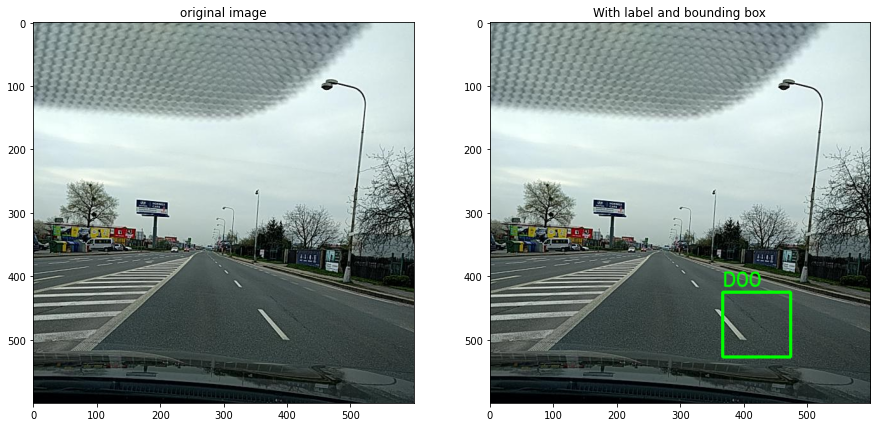

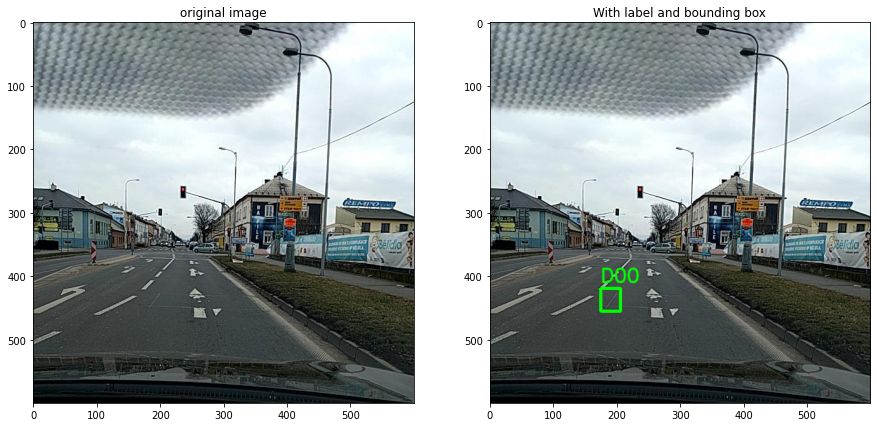

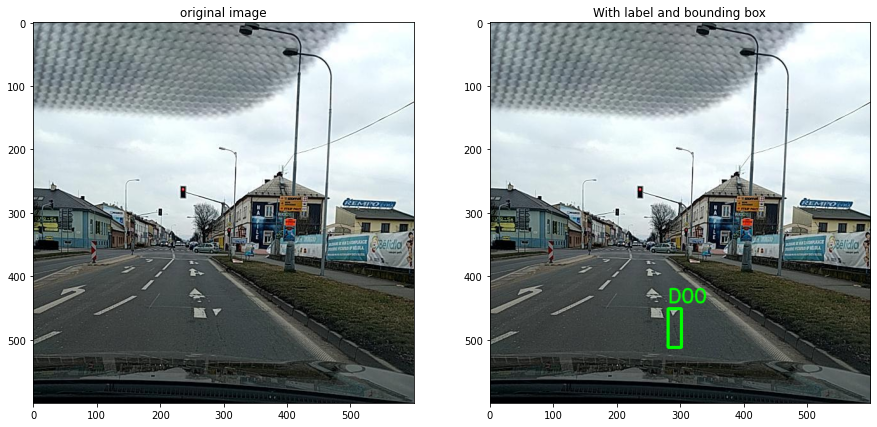

...

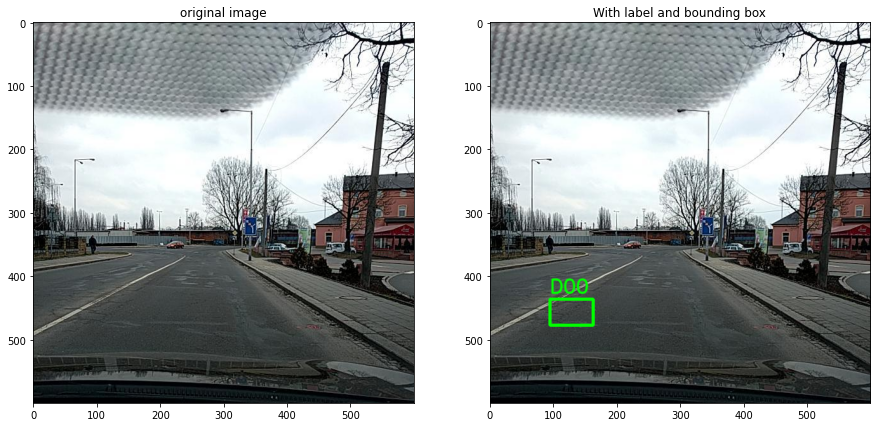

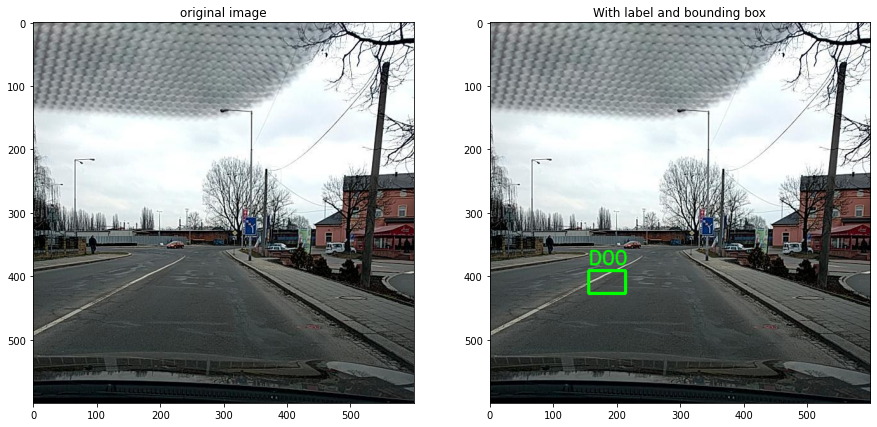

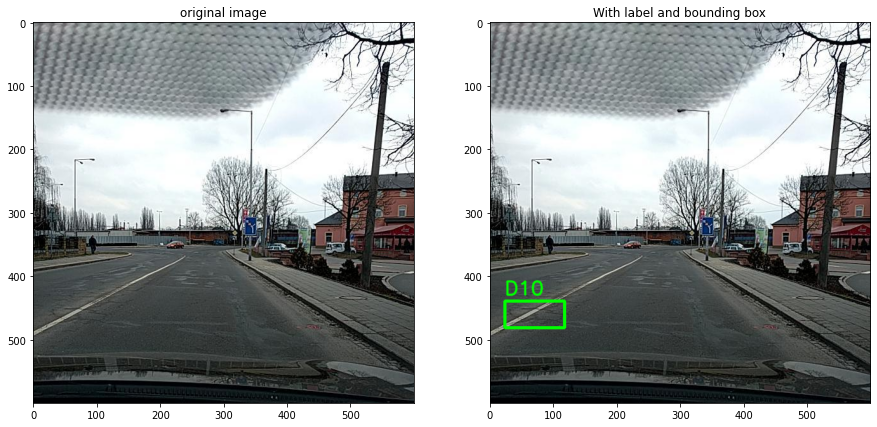

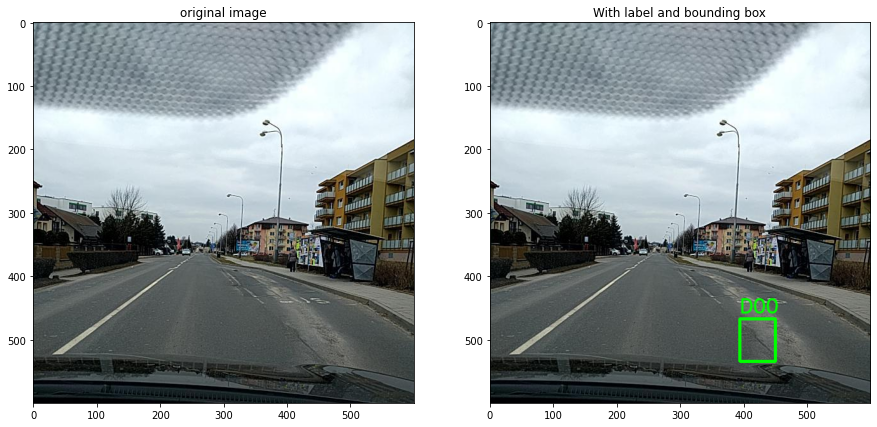

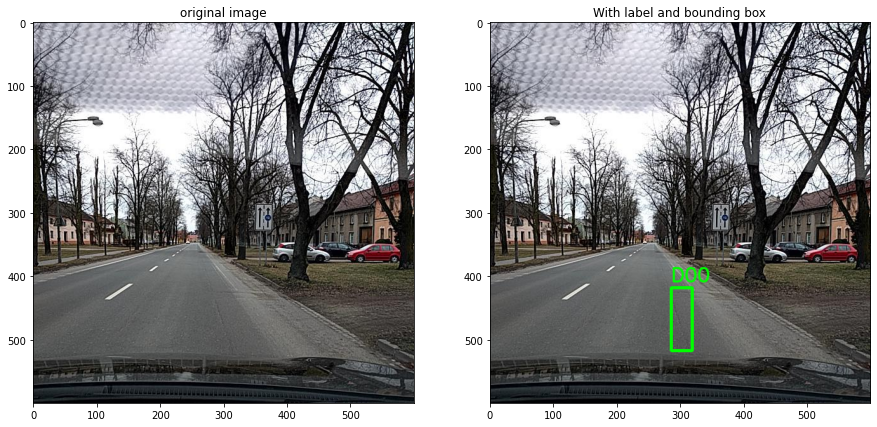

In [ ]:
def show_image_objects(image_row):
  base_path = '/content/data/Images/'
  img_path = '/content/data/Images/' + image_row.filename

  lable = image_row.label
  image = cv2.imread(img_path)
  image1 =  cv2.imread(img_path)
  #draw = image.copy()
  #draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)
  font = cv2.FONT_HERSHEY_SIMPLEX
  image1 = cv2.putText(image1,lable,(image_row.xmin,image_row.ymin-10),font,1,(0,255,0),2,cv2.LINE_AA)
  image1 = cv2.rectangle(image1, (image_row.xmin,image_row.ymin), (image_row.xmax, image_row.ymax), (0,255,0),3)
  #draw_box(draw, box, color=(255, 255, 0))
  plt.figure(figsize=(15,15))
  plt.axis('off')
  plt.subplot(121)
  plt.title('original image')
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.subplot(122)
  plt.title('With label and bounding box')
  plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
  plt.show()
    
#display 20 images and with their mask
for i in range(0,20):
  show_image_objects(labels_df.iloc[i])

In [ ]:
# we will remove 'D0w0' class from csv file we will not use that in training model 

print(labels_df[labels_df['label'] == 'D0w0'])
labels_df_copy = labels_df.copy()
labels_df_copy = labels_df.drop(labels_df[labels_df['label'] == 'D0w0'].index)
print(labels_df_copy.shape)

              filename  width  height label  xmin  ymin  xmax  ymax
9800  India_006389.jpg    720     720  D0w0   455   490   570   663
(34701, 8)


In [ ]:
! rm '/content/data/Images/India_006389.jpg'

India_006389.jpg this image has only one class 'D0w0' so we will remove from our /content/data/Images dir.

In [ ]:
# train - test split 

X_train,X_test = train_test_split(labels_df_copy, test_size=0.2, random_state=42)

print('shape of total data : ',labels_df_copy.shape)
print('shape of train label  : ',X_train.shape)
print('shape of test label : ',X_test.shape)

shape of total data :  (34701, 8)
shape of train label  :  (27760, 8)
shape of test label :  (6941, 8)


In [ ]:
#saving this into csv file for modeling purpose
! mkdir '/content/data/label_csv'
X_train.to_csv('/content/data/label_csv/train_label.csv',index=False)
X_test.to_csv('/content/data/label_csv/test_label.csv',index = False)
labels_df_copy.to_csv('/content/data/label_csv/labels_df.csv',index = False)

### Now we will Look into label_map.pbtxt file 

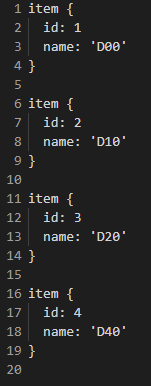

so label_map.pbtxt file has labels with their id .But they given omly 4 labels.
But we have 9 labels so we will edit and modify that file then save in data folder.

item {
  id: 1
  name: 'D00'
}

item {
  id: 2
  name: 'D10'
}

item {
  id: 3
  name: 'D20'
}

item {
  id: 4
  name: 'D40'
}

item {
  id: 5
  name: 'D11'
}

item {
  id: 6
  name: 'D43'
}

item {
  id: 7
  name: 'D44'
}

item {
  id: 8
  name: 'D01'
}

item {
  id: 9
  name: 'D50'
}

After all that we have new folder 'data' that structure is :

data
  |
  |___Annotation
  |
  |___Images
  |
  |___label_csv
  |
  |___label_map.pbtxt


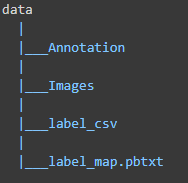


Annotation folder  have all annotation files

Images folder have all the images

label_csv folder have train and test labels csv files

label_map.pbtxt is modified file.

# Observation :

1. We have to total 21041 images and their corresponding xml files

2. We have total 10 classes. In which 'D0w0' is occure only once in Indian dataset. So we can remove that.

3. We have 14569 images that has label.Some of the images have multiple labels.

4. After we convert xml file into csv file the we observe that multiple labeled image has repetaed like 
  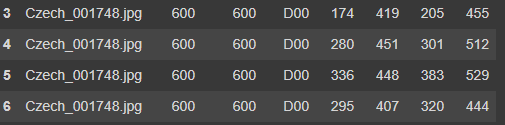


here image is repeated with different lebels . So we may lead to data leakage problem because these repeated images with different labels might go into test data .So we need to tackle this problem.
One thing we can do is split all images randomly  into train and test (We will make two folder).Then we will creat xm to csvfile for train and test set.


5. In label_map.pbtxt have map for only 4 labels so we modified that according 9 classes (D0w0 class is removed)



### Avoiding Data leakage:

In [ ]:
image_with_label = list(set(labels_df_copy.filename.values))

print('Number of images have labels : ', len(image_with_label))

Number of images have labels :  14568


In [ ]:
import random

# creat list of images randomly sample from images that have object
#Since we have ony 14568 images that have labels So we will randomly select from them (80% for train)
train_img = random.sample(image_with_label,k = int(0.8*len(image_with_label)))

In [ ]:
#we creat test set 
test_img = list(set(image_with_label) - set(train_img))

In [ ]:
print('Total images for train : ', len(train_img))
print('Total images for test : ',len(test_img))

Total images for train :  11654
Total images for test :  2914


## Create seperate folder for train and test images in data dir

In [ ]:
! mkdir '/content/data/train_images'

for fil in train_img:
    shutil.copy( '/content/data/Images/'+ fil, "/content/data/train_images")

file_list = [filename for filename in os.listdir('/content/data/train_images')]
print('Total train images in train_images folder  : ',len(file_list)) 

Total train images in train_images folder  :  11654


In [ ]:
! mkdir '/content/data/test_images'

for fil in test_img:
    shutil.copy( '/content/data/Images/'+ fil, "/content/data/test_images")

file_list = [filename for filename in os.listdir('/content/data/test_images')]
print('Total train images in train_images folder  : ',len(file_list)) 

Total train images in train_images folder  :  2914


## Convert train and test annotation files xml to csv

In [ ]:
# xml to csv for train set
base_path =  '/content/data/train_images'
train_label_df = xml_to_csv(base_path)

train_label_df.head(10)

,filename,width,height,label,xmin,ymin,xmax,ymax
0,Japan_003533.jpg,600,600,D10,167,546,448,577
1,Japan_003533.jpg,600,600,D10,219,503,392,530
2,Japan_001962.jpg,600,600,D44,308,337,335,373
3,Japan_001962.jpg,600,600,D44,362,438,468,592
4,Japan_001962.jpg,600,600,D20,72,380,569,595
5,Japan_001962.jpg,600,600,D00,282,340,298,397
6,Japan_012194.jpg,600,600,D44,325,485,508,598
7,Japan_012194.jpg,600,600,D44,106,461,210,566
8,Japan_012194.jpg,600,600,D50,439,517,509,534
9,Japan_005373.jpg,600,600,D00,393,443,451,588


In [ ]:
#xml to csv for test set
base_path =  '/content/data/test_images'
test_label_df = xml_to_csv(base_path)

test_label_df.head(10)

,filename,width,height,label,xmin,ymin,xmax,ymax
0,India_002250.jpg,720,720,D40,412,559,503,617
1,India_002250.jpg,720,720,D40,397,627,450,656
2,India_002250.jpg,720,720,D40,543,592,647,718
3,Japan_002483.jpg,600,600,D50,243,386,324,415
4,Japan_002483.jpg,600,600,D20,19,438,181,583
5,Czech_001874.jpg,600,600,D00,238,385,275,449
6,Japan_001219.jpg,600,600,D00,206,449,243,585
7,Japan_001219.jpg,600,600,D00,167,354,194,441
8,Japan_001219.jpg,600,600,D00,180,289,199,334
9,Japan_001219.jpg,600,600,D00,508,379,600,423


In [ ]:
#cross checking 
print('Total labels in train + test : ',train_label_df.shape[0]+test_label_df.shape[0])

Total labels in train + test :  34701


In [ ]:

test_label_df.to_csv('/content/data/label_csv/test_label.csv',index = False)
train_label_df.to_csv('/content/data/label_csv/train_label.csv',index = False)

My final data folder looks like : 


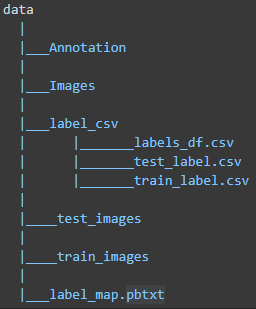

In [ ]:
!zip -r /content/data.zip /content/data